This notebook is based on the article from the link below

Detailed explanation:<br>
https://medium.com/@alexppppp/how-to-create-synthetic-dataset-for-computer-vision-object-detection-fd8ab2fa5249

GitHub repo:<br>
https://github.com/alexppppp/synthetic-dataset-object-detection

On the image below you can see bounding boxes visualized. Each bounding box indicates an object of interest related to a specific class: battery (red), lightbulb (green), padlock (blue).

<p align="center">
    <img src="docs/example1.png"  mode="center" width="800" height="600">
    <br></br>
    <img src="docs/example2.png"  mode="center" width="800" height="600">
</p>

In this demo, we will do:

- cropped photos and masks of the objects of interest (batteries, lightbulbs, padlocks) in various positions;
- background images (just different photos from the internet);
- cropped photos and masks of different objects (cars, chairs, guitars, etc.) which will be used as background noise to make background more complex.

Steps to obtain the synthetic dataset:
- First, we will randomly choose a background image from folder **bg/** and resize it to, for example, 1920x1080.
- Second, we will randomly pick a background noise object from folder **bg_noise/**. Then we’ll ramdomly resize, rotate and add it to the background image.
- We will repeat the second step several times.
- Third, we will randomly pick an object of interest from folders **battery/**, **lightbulb/**, **padlock/**. Then we’ll ramdomly resize, rotate and add it to the background image on the top of background noise objects from the previous step.
- We will repeat the third step several times.

# 1. Imports

In [1]:
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import albumentations as A
import time
from tqdm import tqdm

# 2. Paths to files

Here, we set the lower and upper bounds for resizing object images. We set ‘longest_min’: 150, ‘longest_max’: 800 for each object of interest in dictionary obj_dict. It means that the longest side of the image will be not less than 150px, and not more than 800px.

In [2]:
obj_dict = {
    1: {'folder': "battery", 'longest_min': 150, 'longest_max': 800},
    2: {'folder': "lightbulb", 'longest_min': 150, 'longest_max': 800},
    3: {'folder': "padlock", 'longest_min': 150, 'longest_max': 800}
}

PATH_MAIN = "data"

for k, _ in obj_dict.items():
    folder_name = obj_dict[k]['folder']
    
    files_imgs = sorted(os.listdir(os.path.join(PATH_MAIN, folder_name, 'images')))
    files_imgs = [os.path.join(PATH_MAIN, folder_name, 'images', f) for f in files_imgs]
    
    files_masks = sorted(os.listdir(os.path.join(PATH_MAIN, folder_name, 'masks')))
    files_masks = [os.path.join(PATH_MAIN, folder_name, 'masks', f) for f in files_masks]
    
    obj_dict[k]['images'] = files_imgs
    obj_dict[k]['masks'] = files_masks
    
print("The first five files from the sorted list of battery images:", obj_dict[1]['images'][:5])
print("\nThe first five files from the sorted list of battery masks:", obj_dict[1]['masks'][:5])

files_bg_imgs = os.listdir(os.path.join(PATH_MAIN, 'bg'))
files_bg_imgs = [os.path.join(PATH_MAIN, 'bg', f) for f in files_bg_imgs]

files_bg_noise_imgs = os.listdir(os.path.join(PATH_MAIN, "bg_noise", "images"))
files_bg_noise_imgs = [os.path.join(PATH_MAIN, "bg_noise", "images", f) for f in files_bg_noise_imgs]
files_bg_noise_masks = os.listdir(os.path.join(PATH_MAIN, "bg_noise", "masks"))
files_bg_noise_masks = [os.path.join(PATH_MAIN, "bg_noise", "masks", f) for f in files_bg_noise_masks]

print("\nThe first five files from the sorted list of background images:", files_bg_imgs[:5])
print("\nThe first five files from the sorted list of background noise images:", files_bg_noise_imgs[:5])
print("\nThe first five files from the sorted list of background noise masks:", files_bg_noise_masks[:5])

The first five files from the sorted list of battery images: ['data\\battery\\images\\1.png', 'data\\battery\\images\\10.png', 'data\\battery\\images\\11.png', 'data\\battery\\images\\12.png', 'data\\battery\\images\\13.png']

The first five files from the sorted list of battery masks: ['data\\battery\\masks\\1.png', 'data\\battery\\masks\\10.png', 'data\\battery\\masks\\11.png', 'data\\battery\\masks\\12.png', 'data\\battery\\masks\\13.png']

The first five files from the sorted list of background images: ['data\\bg\\bg_1.jpg', 'data\\bg\\bg_10.jpg', 'data\\bg\\bg_11.jpg', 'data\\bg\\bg_12.jpg', 'data\\bg\\bg_13.jpg']

The first five files from the sorted list of background noise images: ['data\\bg_noise\\images\\1.png', 'data\\bg_noise\\images\\10.jpg', 'data\\bg_noise\\images\\100.jpg', 'data\\bg_noise\\images\\101.png', 'data\\bg_noise\\images\\102.png']

The first five files from the sorted list of background noise masks: ['data\\bg_noise\\masks\\1.png', 'data\\bg_noise\\masks\\10

# 3. Images and masks

In [3]:
def get_img_and_mask(img_path, mask_path):
    """
    Returns the image and mask from the given paths.
    """
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    
    mask_b = mask[:,:,0] == 0 # This is boolean mask
    mask = mask_b.astype(np.uint8) # This is binary mask
    
    return img, mask

Check the function with some examples.

Image file: data\padlock\images\1.png
Mask file: data\padlock\masks\1.png

Shape of the image of the object: (962, 847, 3)
Shape of the binary mask: (962, 847)


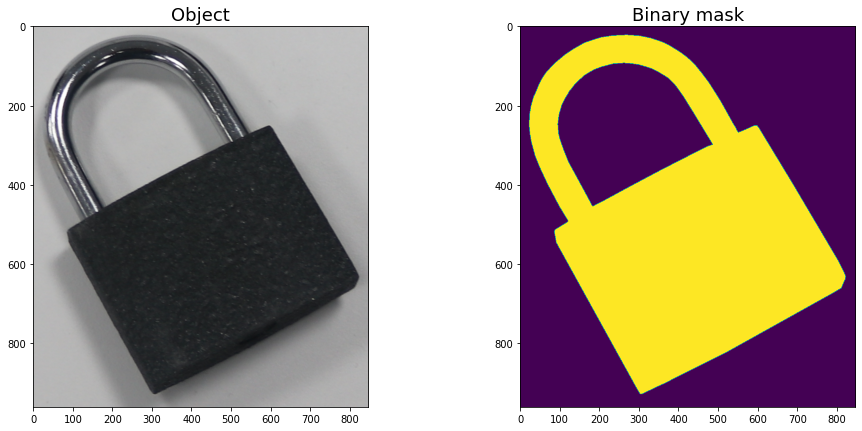

In [4]:
# Let's look at a random object and its binary mask

img_path = obj_dict[3]['images'][0]
mask_path = obj_dict[3]['masks'][0]

img, mask = get_img_and_mask(img_path, mask_path)

print("Image file:", img_path)
print("Mask file:", mask_path)
print("\nShape of the image of the object:", img.shape)
print("Shape of the binary mask:", mask.shape)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img)
ax[0].set_title('Object', fontsize=18)
ax[1].imshow(mask)
ax[1].set_title('Binary mask', fontsize=18);

# 4. Resizing background images

Lets resize all images in the synthetic dataset to have fixed dimensions: 1920x1080 for horizontal ones, and 1080x1920 for vertical ones. 

In [5]:
def resize_img(img, desired_max, desired_min=None):
    """
    Resizes the image to the desired size.
    """
    h, w = img.shape[0], img.shape[1]
    
    longest, shortest = max(h, w), min(h, w)
    longest_new = desired_max
    if desired_min:
        shortest_new = desired_min
    else:
        shortest_new = int(shortest * (longest_new / longest))
    
    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new
        
    transform_resize = A.Compose([
        A.Sequential([
        A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)
        ], p=1)
    ])

    transformed = transform_resize(image=img)
    img_r = transformed["image"]
        
    return img_r

Lets check the function with some examples.

Shape of the original background image: (3068, 2454, 3)
Shape of the resized background image (desired_max=1920, desired_min=None): (1920, 1535, 3)
Shape of the resized background image (desired_max=1920, desired_min=1080): (1920, 1080, 3)


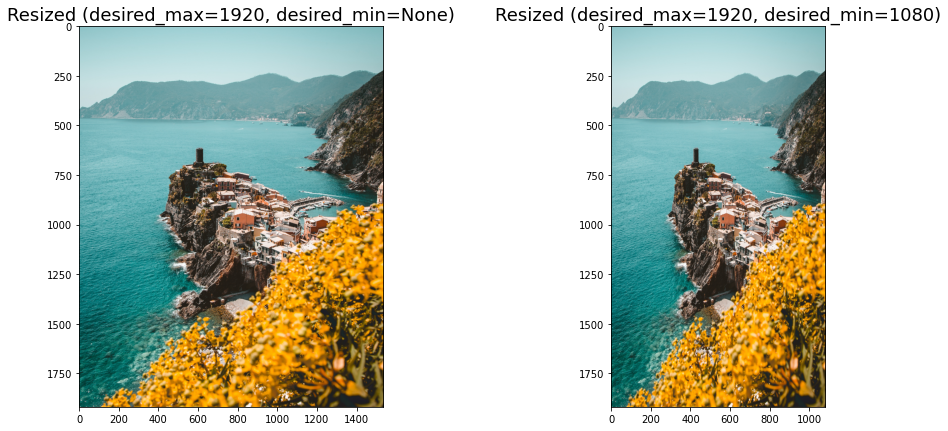

In [6]:
# Let's look how a random background image can be resized with resize_img() function

img_bg_path = files_bg_imgs[5]
img_bg = cv2.imread(img_bg_path)
img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)

img_bg_resized_1 = resize_img(img_bg, desired_max=1920, desired_min=None)
img_bg_resized_2 = resize_img(img_bg, desired_max=1920, desired_min=1080)

print("Shape of the original background image:", img_bg.shape)

print("Shape of the resized background image (desired_max=1920, desired_min=None):", img_bg_resized_1.shape)
print("Shape of the resized background image (desired_max=1920, desired_min=1080):", img_bg_resized_2.shape)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_bg_resized_1)
ax[0].set_title('Resized (desired_max=1920, desired_min=None)', fontsize=18)
ax[1].imshow(img_bg_resized_2)
ax[1].set_title('Resized (desired_max=1920, desired_min=1080)', fontsize=18);

# 5. Resizing and transforming objects

In [7]:
def resize_transform_obj(img, mask, longest_min, longest_max, transforms=False):
    """
    Resizes the and transform the objet to the desired size.
    Arguments:
        img: the image of the object
        mask: the binary mask of the object
        longest_min: the minimum size of the longest side of the object
        longest_max: the maximum size of the longest side of the object
        transforms: if True, the image and mask will be transformed
    Returns:
        img_t: the resized (and transformed) image of the object
        mask_t: the resized (and transformed) binary mask of the object
    """
    h, w = mask.shape[0], mask.shape[1]
    
    longest, shortest = max(h, w), min(h, w)
    longest_new = np.random.randint(longest_min, longest_max)
    shortest_new = int(shortest * (longest_new / longest))
    
    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new
        
    transform_resize = A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)

    transformed_resized = transform_resize(image=img, mask=mask)
    img_t = transformed_resized["image"]
    mask_t = transformed_resized["mask"]
        
    if transforms:
        transformed = transforms(image=img_t, mask=mask_t)
        img_t = transformed["image"]
        mask_t = transformed["mask"]
        
    return img_t, mask_t

transforms_bg_obj = A.Compose([
    A.RandomRotate90(p=1),
    A.ColorJitter(brightness=0.3,
                  contrast=0.3,
                  saturation=0.3,
                  hue=0.07,
                  always_apply=False,
                  p=1),
    A.Blur(blur_limit=(3,15),
           always_apply=False,
           p=0.5)
])

transforms_obj = A.Compose([
    A.RandomRotate90(p=1),
    A.RandomBrightnessContrast(brightness_limit=(-0.1, 0.2),
                               contrast_limit=0.1,
                               brightness_by_max=True,
                               always_apply=False,
                               p=1)
])

Shape of the image of the transformed object: (394, 346, 3) instead of (962, 847, 3)
Shape of the transformed binary mask: (394, 346) instead of (962, 847)




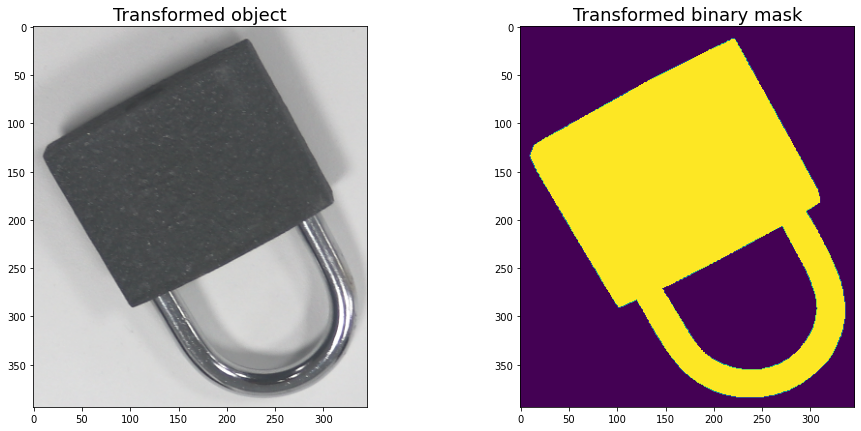

In [8]:
# Let's look how image and binary mask of a random object can be transformed
# with help of resize_transform_obj() function

img_path = obj_dict[3]['images'][0]
mask_path = obj_dict[3]['masks'][0]

img, mask = get_img_and_mask(img_path, mask_path)

img_t, mask_t = resize_transform_obj(img,
                                     mask,
                                     longest_min=300,
                                     longest_max=400,
                                     transforms=transforms_obj)

print(f"Shape of the image of the transformed object: {img_t.shape} instead of {img.shape}")
print(f"Shape of the transformed binary mask: {mask_t.shape} instead of {mask.shape}")
print("\n")

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_t)
ax[0].set_title('Transformed object', fontsize=18)
ax[1].imshow(mask_t)
ax[1].set_title('Transformed binary mask', fontsize=18);

# 6. Adding object to background

Now we’ll define function `add_obj()` which adds object to background.<br>
The function returns image composition (background + added objects), mask composition (composition of masks for added objects), and mask of the last added object.

In [9]:
def add_obj(img_comp, mask_comp, img, mask, x, y, idx):
    '''
    Adds an object to the image and binary mask.
    Arguments:
        img_comp - composition of objects
        mask_comp - composition of objects` masks
        img - image of object
        mask - binary mask of object
        x, y - coordinates where center of img is placed
        idx - index of object
    Returns:
        img_comp in CV2 RGB format
        mask_comp in CV2 binary format
        mask_added - binary mask of added object
    '''
    h_comp, w_comp = img_comp.shape[0], img_comp.shape[1]
    
    h, w = img.shape[0], img.shape[1]
    
    x = x - int(w/2)
    y = y - int(h/2)
    
    mask_b = mask == 1
    mask_rgb_b = np.stack([mask_b, mask_b, mask_b], axis=2)
    
    if x >= 0 and y >= 0:
    
        h_part = h - max(0, y+h-h_comp) # h_part - part of the image which gets into the frame of img_comp along y-axis
        w_part = w - max(0, x+w-w_comp) # w_part - part of the image which gets into the frame of img_comp along x-axis

        img_comp[y:y+h_part, x:x+w_part, :] = img_comp[y:y+h_part, x:x+w_part, :] * ~mask_rgb_b[0:h_part, 0:w_part, :] + (img * mask_rgb_b)[0:h_part, 0:w_part, :]
        mask_comp[y:y+h_part, x:x+w_part] = mask_comp[y:y+h_part, x:x+w_part] * ~mask_b[0:h_part, 0:w_part] + (idx * mask_b)[0:h_part, 0:w_part]
        mask_added = mask[0:h_part, 0:w_part]
        
    elif x < 0 and y < 0:
        
        h_part = h + y
        w_part = w + x
        
        img_comp[0:0+h_part, 0:0+w_part, :] = img_comp[0:0+h_part, 0:0+w_part, :] * ~mask_rgb_b[h-h_part:h, w-w_part:w, :] + (img * mask_rgb_b)[h-h_part:h, w-w_part:w, :]
        mask_comp[0:0+h_part, 0:0+w_part] = mask_comp[0:0+h_part, 0:0+w_part] * ~mask_b[h-h_part:h, w-w_part:w] + (idx * mask_b)[h-h_part:h, w-w_part:w]
        mask_added = mask[h-h_part:h, w-w_part:w]
        
    elif x < 0 and y >= 0:
        
        h_part = h - max(0, y+h-h_comp)
        w_part = w + x
        
        img_comp[y:y+h_part, 0:0+w_part, :] = img_comp[y:y+h_part, 0:0+w_part, :] * ~mask_rgb_b[0:h_part, w-w_part:w, :] + (img * mask_rgb_b)[0:h_part, w-w_part:w, :]
        mask_comp[y:y+h_part, 0:0+w_part] = mask_comp[y:y+h_part, 0:0+w_part] * ~mask_b[0:h_part, w-w_part:w] + (idx * mask_b)[0:h_part, w-w_part:w]
        mask_added = mask[0:h_part, w-w_part:w]
        
    elif x >= 0 and y < 0:
        
        h_part = h + y
        w_part = w - max(0, x+w-w_comp)
        
        img_comp[0:0+h_part, x:x+w_part, :] = img_comp[0:0+h_part, x:x+w_part, :] * ~mask_rgb_b[h-h_part:h, 0:w_part, :] + (img * mask_rgb_b)[h-h_part:h, 0:w_part, :]
        mask_comp[0:0+h_part, x:x+w_part] = mask_comp[0:0+h_part, x:x+w_part] * ~mask_b[h-h_part:h, 0:w_part] + (idx * mask_b)[h-h_part:h, 0:w_part]
        mask_added = mask[h-h_part:h, 0:w_part]
    
    return img_comp, mask_comp, mask_added

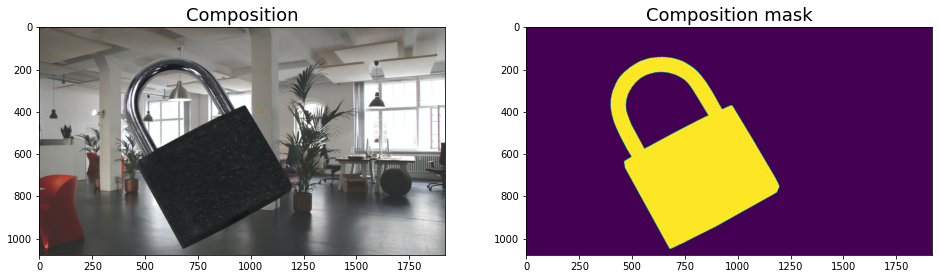

In [10]:
# Test the function

img_bg_path = files_bg_imgs[26]
img_bg = cv2.imread(img_bg_path)
img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)

h, w = img_bg.shape[0], img_bg.shape[1]
mask_comp = np.zeros((h,w), dtype=np.uint8)

img_path = obj_dict[3]['images'][0]
mask_path = obj_dict[3]['masks'][0]
img, mask = get_img_and_mask(img_path, mask_path)

img_comp, mask_comp, _ = add_obj(img_bg, mask_comp, img, mask, x=800, y=600, idx=1)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(mask_comp)
ax[1].set_title('Composition mask', fontsize=18);

Now, the initial composition *img_comp* already contains one padlock, so the mask of the initial composition *mask_comp* contains numbers 0 and 1.<br>
With adding one more padlock to the composition, this padlock’s mask is added to *mask_comp* by overlapping initial values with 2 in those pixels, which correspond to the added padlock on the image composition. This time we defined the number 2 for the mask of added padlock by passing parameter `idx=2` to function `add_obj()`.

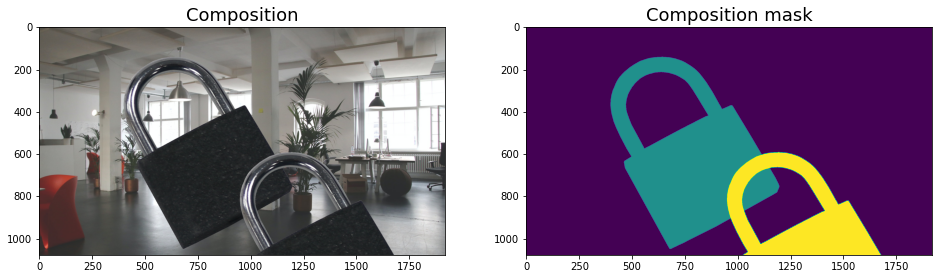

In [11]:
img_comp, mask_comp, _ = add_obj(img_comp, mask_comp, img, mask, x=1350, y=1050, idx=2)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(mask_comp)
ax[1].set_title('Composition mask', fontsize=18);

# 7. Adding noise objects to background

The idea is to have dataset with backgrounds as varied as possible.<br>
Different backgrounds are good for training process of object detection neural network. But we have only 30 background images, which is not much if, for example, we are going to create dataset of 1000 or more images.
To make backgrounds more varied, we will randomly add noise objects.

In [12]:
def create_bg_with_noise(files_bg_imgs,
                         files_bg_noise_imgs,
                         files_bg_noise_masks,
                         bg_max=1920,
                         bg_min=1080,
                         max_objs_to_add=60,
                         longest_bg_noise_max=1000,
                         longest_bg_noise_min=200,
                         blank_bg=False):
    """
    Creates a background with noise and adds objects to it.
    Args:
        files_bg_imgs: list of paths to background images
        files_bg_noise_imgs: list of paths to background noise images
        files_bg_noise_masks: list of paths to background noise masks
        bg_max: maximum height and width of background
        bg_min: minimum height and width of background
        max_objs_to_add: maximum number of objects to add to background
        longest_bg_noise_max: maximum length of background noise. Should be less than bg_min
        longest_bg_noise_min: minimum length of background noise. Should be at least 30
        blank_bg: whether to use a blank background
    Returns:
        img_comp_bg: background with added objects
    """
    # Get background image
    if blank_bg:
        img_comp_bg = np.ones((bg_min, bg_max,3), dtype=np.uint8) * 255
        mask_comp_bg = np.zeros((bg_min, bg_max), dtype=np.uint8)
    else:    
        idx = np.random.randint(len(files_bg_imgs))
        img_bg = cv2.imread(files_bg_imgs[idx])
        img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)
        img_comp_bg = resize_img(img_bg, bg_max, bg_min)
        mask_comp_bg = np.zeros((img_comp_bg.shape[0], img_comp_bg.shape[1]), dtype=np.uint8)
    # Get background noise image
    for i in range(1, np.random.randint(max_objs_to_add) + 2):
        idx = np.random.randint(len(files_bg_noise_imgs))
        img, mask = get_img_and_mask(files_bg_noise_imgs[idx], files_bg_noise_masks[idx])
        x, y = np.random.randint(img_comp_bg.shape[1]), np.random.randint(img_comp_bg.shape[0])
        img_t, mask_t = resize_transform_obj(img, mask, longest_bg_noise_min, longest_bg_noise_max, transforms=transforms_bg_obj)
        img_comp_bg, _, _ = add_obj(img_comp_bg, mask_comp_bg, img_t, mask_t, x, y, i)
        
    return img_comp_bg

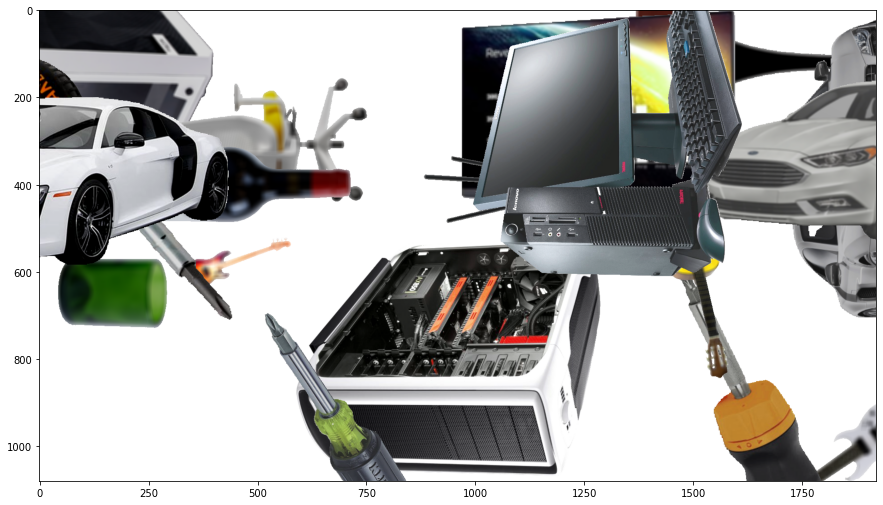

In [13]:
img_comp_bg = create_bg_with_noise(files_bg_imgs,
                                   files_bg_noise_imgs,
                                   files_bg_noise_masks,
                                   max_objs_to_add=20,
                                   blank_bg=True)
plt.figure(figsize=(15,15))
plt.imshow(img_comp_bg)

Now, we will chose a random image for background from folder **bg_noise/**. Then we’ll randomly resize, rotate and add it to the background image.

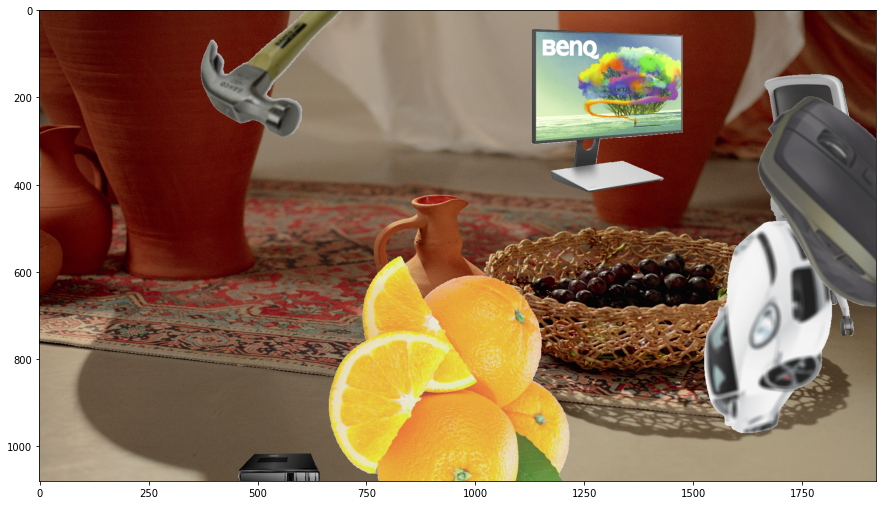

In [16]:
img_comp_bg = create_bg_with_noise(files_bg_imgs,
                                   files_bg_noise_imgs,
                                   files_bg_noise_masks,
                                   max_objs_to_add=20)
plt.figure(figsize=(15,15))
plt.imshow(img_comp_bg)

# 8. Controlling degree of overlapping

We might want to control the degree of overlapping, and make it less then 20% or 30%.<br> Or we might want our objects of interest don’t overlap at all.

In [17]:
def check_areas(mask_comp, obj_areas, overlap_degree=0.3):
    """
    Checks if the areas of the objects in the composition mask are within the
    allowed range.
    Args:
        mask_comp: composition mask
        obj_areas: list of areas of objects in the composition mask
        overlap_degree: maximum allowed degree of overlap between objects
    Returns:
        True if all areas are within the allowed range, False otherwise
    """
    obj_ids = np.unique(mask_comp).astype(np.uint8)[1:-1]
    masks = mask_comp == obj_ids[:, None, None]
    
    ok = True
    
    if len(np.unique(mask_comp)) != np.max(mask_comp) + 1:
        ok = False
        return ok
    
    for idx, mask in enumerate(masks):
        if np.count_nonzero(mask) / obj_areas[idx] < 1 - overlap_degree:
            ok = False
            break
            
    return ok

# 9. Creating synthetic composition

The function `create_synthetic_composition()` creates synthetic composition of images and masks.

In [18]:
def create_synthetic_composition(img_comp_bg,
                       max_objs=15,
                       overlap_degree=0.2,
                       max_attempts_per_obj=10):
    """
    Creates a composition mask with objects.
    Args:
        img_comp_bg: background with added objects
        max_objs: maximum number of objects in composition mask
        overlap_degree: maximum allowed degree of overlap between objects
        max_attempts_per_obj: maximum number of attempts to add an object to composition mask
    Returns:
        img_comp: composition mask with objects of interest
        mask_comp: composition mask with objects. Background pixels have value 0, pixels of the first added object have value 1, 
            pixels of the second added object have value 2, and so on.
        labels_comp: numerical representation of classes, following the order of added objects. Recall the obj_dict definition
        obj_areas: areas of objects in composition mask in order of added objects
    """
    img_comp = img_comp_bg.copy()
    h, w = img_comp.shape[0], img_comp.shape[1]
    mask_comp = np.zeros((h,w), dtype=np.uint8)
    
    obj_areas = []
    labels_comp = []
    num_objs = np.random.randint(max_objs) + 2
    
    i = 1
    
    for _ in range(1, num_objs):

        obj_idx = np.random.randint(len(obj_dict)) + 1
        
        for _ in range(max_attempts_per_obj):

            imgs_number = len(obj_dict[obj_idx]['images'])
            idx = np.random.randint(imgs_number)
            img_path = obj_dict[obj_idx]['images'][idx]
            mask_path = obj_dict[obj_idx]['masks'][idx]
            img, mask = get_img_and_mask(img_path, mask_path)

            x, y = np.random.randint(w), np.random.randint(h)
            longest_min = obj_dict[obj_idx]['longest_min']
            longest_max = obj_dict[obj_idx]['longest_max']
            img, mask = resize_transform_obj(img,
                                             mask,
                                             longest_min,
                                             longest_max,
                                             transforms=transforms_obj)

            if i == 1:
                img_comp, mask_comp, mask_added = add_obj(img_comp,
                                                          mask_comp,
                                                          img,
                                                          mask,
                                                          x,
                                                          y,
                                                          i)
                obj_areas.append(np.count_nonzero(mask_added))
                labels_comp.append(obj_idx)
                i += 1
                break
            else:        
                img_comp_prev, mask_comp_prev = img_comp.copy(), mask_comp.copy()
                img_comp, mask_comp, mask_added = add_obj(img_comp,
                                                          mask_comp,
                                                          img,
                                                          mask,
                                                          x,
                                                          y,
                                                          i)
                ok = check_areas(mask_comp, obj_areas, overlap_degree)
                if ok:
                    obj_areas.append(np.count_nonzero(mask_added))
                    labels_comp.append(obj_idx)
                    i += 1
                    break
                else:
                    img_comp, mask_comp = img_comp_prev.copy(), mask_comp_prev.copy()        
        
    return img_comp, mask_comp, labels_comp, obj_areas

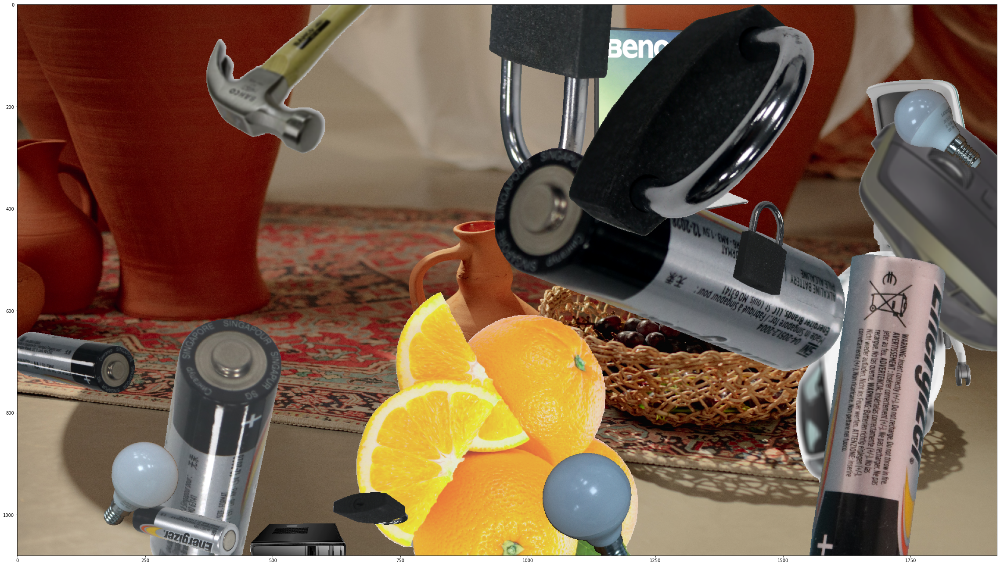

In [19]:
img_comp, mask_comp, labels_comp, obj_areas = create_synthetic_composition(img_comp_bg,
                                                                 max_objs=15,
                                                                 overlap_degree=0.2,
                                                                 max_attempts_per_obj=10)
plt.figure(figsize=(40,40))
plt.imshow(img_comp)

Lets check the mask of this synthetic composition.

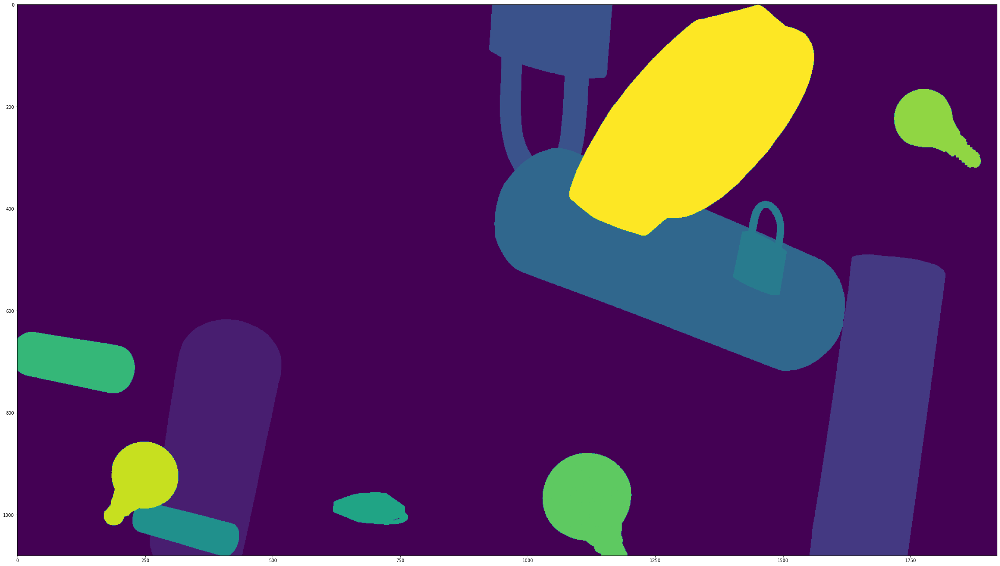

In [20]:
plt.figure(figsize=(40,40))
plt.imshow(mask_comp)

Looking to the mask, we can see all the objects of interest.

In [21]:
print("Labels (classes of the objects) on the composition in order of object's addition:", labels_comp)

Labels (classes of the objects) on the composition in order of object's addition: [1, 1, 3, 1, 3, 1, 3, 1, 2, 2, 2, 3]


3 is padlock, 1 is baterry, and so on.

In [22]:
obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
masks = mask_comp == obj_ids[:, None, None]

print("Degree of how much area of each object is overlapped:")

for idx, mask in enumerate(masks):
    print(np.count_nonzero(mask) / obj_areas[idx])

Degree of how much area of each object is overlapped:
0.8391890505874711
1.0
0.8791240875912408
0.8176832823203615
1.0
0.9671830878424789
1.0
1.0
1.0
1.0
1.0
1.0


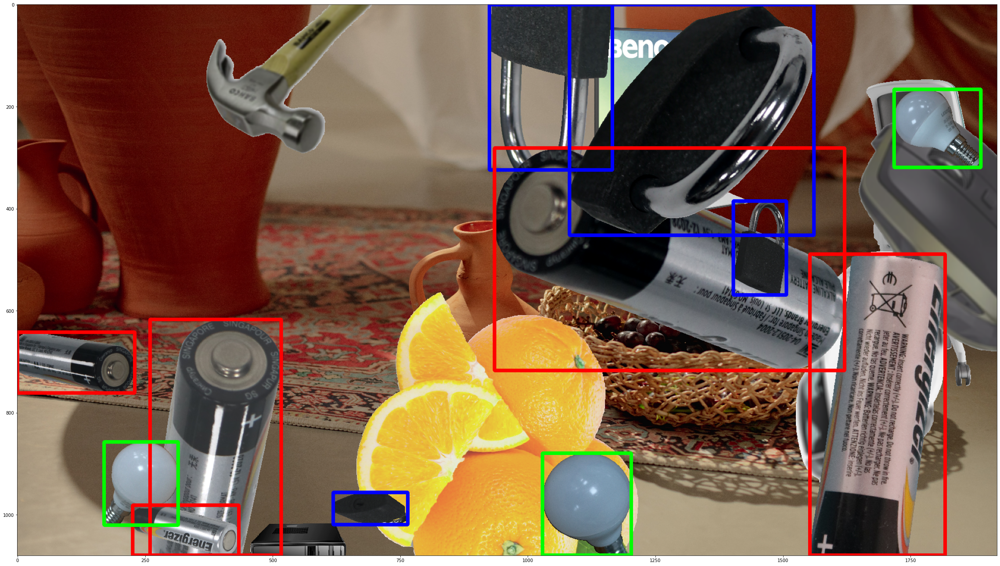

In [23]:
colors = {1: (255,0,0), 2: (0,255,0), 3: (0,0,255)}

img_comp_bboxes = img_comp.copy()

obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
masks = mask_comp == obj_ids[:, None, None]
# create bounding boxes
for i in range(len(obj_ids)):
    pos = np.where(masks[i])
    xmin = np.min(pos[1])
    xmax = np.max(pos[1])
    ymin = np.min(pos[0])
    ymax = np.max(pos[0])
    img_comp_bboxes = cv2.rectangle(img_comp_bboxes,
                                    (xmin, ymin),
                                    (xmax,ymax),
                                    colors[labels_comp[i]],
                                    6)
    
plt.figure(figsize=(40,40))
plt.imshow(img_comp_bboxes)    

# 10. Annotations in YOLO format

YOLO format requires annotations to be stored as txt-files.<br> 
In yolo, a bounding box is represented by four values [`object_class`, `x_center`, `y_center`, `width`, `height`]. Note that `object_class` is not part of YOLO format, but we are adding just to facilitate during reading configuration. You can remove `object_class` if you want. `x_center` and `y_center` are the normalized coordinates of the *center of the bounding box*. To make coordinates normalized, we take pixel values of `x` and `y`, which marks the center of the bounding box on the x-axis and y-axis. Then we divide the value of `x` by the `width` of the image and value of `y` by the `height` of the image. width and height represent the width and the height of the bounding box. They are normalized as well.

Coordinates of an example bounding box in this format are<br> `[((420 + 98) / 2) / 640, ((462 + 345) / 2) / 480, 322 / 640, 117 / 480]` which are<br> `[0.4046875, 0.840625, 0.503125, 0.24375]`.

In [24]:
def create_yolo_annotations(mask_comp, labels_comp):
    """
    Creates yolo annotations for the composition mask.
    Args:
        mask_comp: composition mask with objects
        labels_comp: labels of objects in composition
    Returns:
        annotations_yolo: list of annotations
    """
    comp_w, comp_h = mask_comp.shape[1], mask_comp.shape[0]
    
    obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
    masks = mask_comp == obj_ids[:, None, None]

    annotations_yolo = []
    for i in range(len(labels_comp)):
        pos = np.where(masks[i])
        xmin = np.min(pos[1])
        xmax = np.max(pos[1])
        ymin = np.min(pos[0])
        ymax = np.max(pos[0])

        xc = (xmin + xmax) / 2  # center x
        yc = (ymin + ymax) / 2  # center y
        w = xmax - xmin         # width
        h = ymax - ymin         # height
        # normalize the bounding box coordinates between 0 and 1
        annotations_yolo.append([labels_comp[i] - 1,    # class index, YOLO starts from 0
                                 round(xc/comp_w, 5),   # normalized center x
                                 round(yc/comp_h, 5),   # normalized center y
                                 round(w/comp_w, 5),    # normalized width
                                 round(h/comp_h, 5)])   # normalized height

    return annotations_yolo

In [25]:
annotations_yolo = create_yolo_annotations(mask_comp, labels_comp)
for i in range(len(annotations_yolo)):
    print(' '.join(str(el) for el in annotations_yolo[i]))

0 0.20234 0.78519 0.13385 0.42778
0 0.87786 0.72593 0.13802 0.5463
2 0.54453 0.15 0.12552 0.3
0 0.66562 0.46204 0.35729 0.4037
2 0.75781 0.44167 0.05417 0.17037
0 0.17188 0.9537 0.10833 0.09074
2 0.36042 0.91435 0.07604 0.05833
0 0.0599 0.64954 0.11979 0.11019
1 0.58125 0.90648 0.09062 0.18519
1 0.93906 0.22454 0.08854 0.14167
1 0.1263 0.86898 0.07552 0.15093
2 0.68828 0.20926 0.24948 0.41852


It’s important to note that numeric classes of objects here are starting from 0, instead of 1. In array labels_comp 1 is related to battery, 2 is related to lightbulb and 3 is related to padlock. But, in annotations, classes of the objects should start with 0, it’s YOLO format requirement, so we decrease each number by one, which means that in annotations 0 is related to battery, 1 is related to lightbulb and 2 is related to padlock.

# 11. Creating and saving synthetic dataset



In [32]:
def generate_dataset4yolo(imgs_number, folder, split='train'):
    """
    Generates dataset for yolo training.
    Args:
        imgs_number: number of images to generate
        folder: folder to save images and annotations
        split: train or test
    """
    time_start = time.time()

    # create folder if it doesn't exist
    folder_split_images = os.path.join(folder, split, 'images')
    if not os.path.exists(folder_split_images):
        os.makedirs(folder_split_images)
    folder_split_labels = os.path.join(folder, split, 'labels')
    if not os.path.exists(folder_split_labels):
        os.makedirs(folder_split_labels)
    
    for j in tqdm(range(imgs_number)):
        img_comp_bg = create_bg_with_noise(files_bg_imgs,
                                           files_bg_noise_imgs,
                                           files_bg_noise_masks,
                                           max_objs_to_add=60)
        
        img_comp, mask_comp, labels_comp, _ = create_synthetic_composition(img_comp_bg,
                                                                 max_objs=15,
                                                                 overlap_degree=0.2,
                                                                 max_attempts_per_obj=10)

        img_comp = cv2.cvtColor(img_comp, cv2.COLOR_RGB2BGR)
        cv2.imwrite(os.path.join(folder_split_images, '{}.jpg').format(j), img_comp)

        annotations_yolo = create_yolo_annotations(mask_comp, labels_comp)
        for i in range(len(annotations_yolo)):
            with open(os.path.join(folder_split_labels, '{}.txt').format(j), "a") as f:
                f.write(' '.join(str(el) for el in annotations_yolo[i]) + '\n')
                
    time_end = time.time()
    time_total = round(time_end - time_start)
    time_per_img = round((time_end - time_start) / imgs_number, 1)
    
    print("Generation of {} synthetic images is completed. It took {} seconds, or {} seconds per image".format(imgs_number, time_total, time_per_img))
    print(f"Images are stored in '{folder_split_images}'")
    print(f"Annotations are stored in '{folder_split_labels}'" + '\n')

In [33]:
folder_data = os.path.join('dataset', 'yolo')
# check if folder exists
if not os.path.exists(folder_data):
    os.makedirs(folder_data)
generate_dataset4yolo(100, folder=folder_data, split='train')
generate_dataset4yolo(20, folder=folder_data, split='valid')

100%|██████████| 100/100 [05:03<00:00,  3.03s/it]


Generation of 100 synthetic images is completed. It took 303 seconds, or 3.0 seconds per image
Images are stored in 'dataset\yolo\train\images'
Annotations are stored in 'dataset\yolo\train\labels'



100%|██████████| 20/20 [01:05<00:00,  3.28s/it]

Generation of 20 synthetic images is completed. It took 66 seconds, or 3.3 seconds per image
Images are stored in 'dataset\yolo\valid\images'
Annotations are stored in 'dataset\yolo\valid\labels'



# 12. Annotations in COCO format

COCO format requires annotations to be stored as json-files.<br> 
In coco, a bounding box is defined by four values in pixels `[x_min, y_min, width, height]`. They are coordinates of the `top-left` corner along with the `width` and `height` of the bounding box.

Coordinates of an example bounding box in this format are `[98, 345, 322, 117]`

In [71]:
def create_coco_annotations(mask_comp, labels_comp):
    """
    Creates coco annotations for the composition mask.
    Args:
        mask_comp: composition mask with objects
        labels_comp: labels of objects in composition
    Returns:
        annotations_coco: list of annotations
    """
    comp_w, comp_h = mask_comp.shape[1], mask_comp.shape[0]
    
    obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
    masks = mask_comp == obj_ids[:, None, None]

    annotations_coco = []
    for i in range(len(labels_comp)):
        pos = np.where(masks[i])
        xmin = np.min(pos[1])
        xmax = np.max(pos[1])
        ymin = np.min(pos[0])
        ymax = np.max(pos[0])

        xc = (xmin + xmax) / 2  # center x
        yc = (ymin + ymax) / 2  # center y
        w = xmax - xmin         # width
        h = ymax - ymin         # height
        # normalize the bounding box coordinates between 0 and 1
        annotations_coco.append({"category_id": labels_comp[i] - 0,
                                 "segmentation": [[round(xc/comp_w, 5), round(yc/comp_h, 5), round(w/comp_w, 5), round(h/comp_h, 5)]],
                                 "area": round(w*h, 5),
                                 "bbox": [round(xc/comp_w, 5), round(yc/comp_h, 5), round(w/comp_w, 5), round(h/comp_h, 5)],
                                 "iscrowd": 0})
        
    return annotations_coco

In [76]:
annotations_coco = create_coco_annotations(mask_comp, labels_comp)
for i in range(len(annotations_coco)):
    print(annotations_coco[i])

print(annotations_coco)


{'category_id': 1, 'segmentation': [[0.20234, 0.78519, 0.13385, 0.42778]], 'area': 118734, 'bbox': [0.20234, 0.78519, 0.13385, 0.42778], 'iscrowd': 0}
{'category_id': 1, 'segmentation': [[0.87786, 0.72593, 0.13802, 0.5463]], 'area': 156350, 'bbox': [0.87786, 0.72593, 0.13802, 0.5463], 'iscrowd': 0}
{'category_id': 3, 'segmentation': [[0.54453, 0.15, 0.12552, 0.3]], 'area': 78084, 'bbox': [0.54453, 0.15, 0.12552, 0.3], 'iscrowd': 0}
{'category_id': 1, 'segmentation': [[0.66562, 0.46204, 0.35729, 0.4037]], 'area': 299096, 'bbox': [0.66562, 0.46204, 0.35729, 0.4037], 'iscrowd': 0}
{'category_id': 3, 'segmentation': [[0.75781, 0.44167, 0.05417, 0.17037]], 'area': 19136, 'bbox': [0.75781, 0.44167, 0.05417, 0.17037], 'iscrowd': 0}
{'category_id': 1, 'segmentation': [[0.17188, 0.9537, 0.10833, 0.09074]], 'area': 20384, 'bbox': [0.17188, 0.9537, 0.10833, 0.09074], 'iscrowd': 0}
{'category_id': 3, 'segmentation': [[0.36042, 0.91435, 0.07604, 0.05833]], 'area': 9198, 'bbox': [0.36042, 0.91435, 0

# 13. Creating and saving synthetic dataset

In [78]:
class NumpyEncoder(json.JSONEncoder):
    """ Custom encoder for numpy data types """
    def default(self, obj):
        if isinstance(obj, (np.int_, np.intc, np.intp, np.int8,
                            np.int16, np.int32, np.int64, np.uint8,
                            np.uint16, np.uint32, np.uint64)):

            return int(obj)

        elif isinstance(obj, (np.float_, np.float16, np.float32, np.float64)):
            return float(obj)

        elif isinstance(obj, (np.complex_, np.complex64, np.complex128)):
            return {'real': obj.real, 'imag': obj.imag}

        elif isinstance(obj, (np.ndarray,)):
            return obj.tolist()

        elif isinstance(obj, (np.bool_)):
            return bool(obj)

        elif isinstance(obj, (np.void)): 
            return None

        return json.JSONEncoder.default(self, obj)

In [79]:
import json

def generate_dataset4coco(imgs_number, folder, split='train'):
    """
    Generates dataset for coco training.
    Args:
        imgs_number: number of images to generate
        folder: folder to save images and annotations
        split: train or test
    """
    time_start = time.time()

    # create folder if it doesn't exist
    folder_split_images = os.path.join(folder, split, 'images')
    if not os.path.exists(folder_split_images):
        os.makedirs(folder_split_images)
    folder_split_annotations = os.path.join(folder, split, 'annotations')
    if not os.path.exists(folder_split_annotations):
        os.makedirs(folder_split_annotations)
    
    for j in tqdm(range(imgs_number)):
        img_comp_bg = create_bg_with_noise(files_bg_imgs,
                                           files_bg_noise_imgs,
                                           files_bg_noise_masks,
                                           max_objs_to_add=60)
        
        img_comp, mask_comp, labels_comp, _ = create_synthetic_composition(img_comp_bg,
                                                                 max_objs=15,
                                                                 overlap_degree=0.2,
                                                                 max_attempts_per_obj=10)

        img_comp = cv2.cvtColor(img_comp, cv2.COLOR_RGB2BGR)
        cv2.imwrite(os.path.join(folder_split_images, '{}.jpg').format(j), img_comp)

        annotations_coco = create_coco_annotations(mask_comp, labels_comp)
        #print(annotations_coco)
        #ann_string = json.dumps(annotations_coco)
        #print(annotations_coco, ann_string)
        #print(' ---- ')
        with open(os.path.join(folder_split_annotations, '{}.json').format(j), "w") as f:
            json.dump(annotations_coco, f, ensure_ascii=False, indent=4, cls=NumpyEncoder)
                
    time_end = time.time()
    time_total = round(time_end - time_start)
    time_per_img = round((time_end - time_start) / imgs_number, 1)
    
    print("Generation of {} synthetic images is completed. It took {} seconds, or {} seconds per image".format(imgs_number, time_total, time_per_img))
    print(f"Images are stored in '{folder_split_images}'")
    print(f"Annotations are stored in '{folder_split_annotations}'" + '\n')

In [80]:
generate_dataset4coco(100, folder='dataset/coco', split='train')
generate_dataset4coco(20, folder='dataset/coco', split='valid')

100%|██████████| 100/100 [04:58<00:00,  2.99s/it]


Generation of 100 synthetic images is completed. It took 299 seconds, or 3.0 seconds per image
Images are stored in 'dataset/coco\train\images'
Annotations are stored in 'dataset/coco\train\annotations'



100%|██████████| 20/20 [01:02<00:00,  3.11s/it]

Generation of 20 synthetic images is completed. It took 62 seconds, or 3.1 seconds per image
Images are stored in 'dataset/coco\valid\images'
Annotations are stored in 'dataset/coco\valid\annotations'



In [70]:
print(annotations_coco)

[{'category_id': 1, 'segmentation': [[0.20234, 0.78519, 0.13385, 0.42778]], 'area': 118734, 'bbox': [0.20234, 0.78519, 0.13385, 0.42778], 'iscrowd': 0}, {'category_id': 1, 'segmentation': [[0.87786, 0.72593, 0.13802, 0.5463]], 'area': 156350, 'bbox': [0.87786, 0.72593, 0.13802, 0.5463], 'iscrowd': 0}, {'category_id': 3, 'segmentation': [[0.54453, 0.15, 0.12552, 0.3]], 'area': 78084, 'bbox': [0.54453, 0.15, 0.12552, 0.3], 'iscrowd': 0}, {'category_id': 1, 'segmentation': [[0.66562, 0.46204, 0.35729, 0.4037]], 'area': 299096, 'bbox': [0.66562, 0.46204, 0.35729, 0.4037], 'iscrowd': 0}, {'category_id': 3, 'segmentation': [[0.75781, 0.44167, 0.05417, 0.17037]], 'area': 19136, 'bbox': [0.75781, 0.44167, 0.05417, 0.17037], 'iscrowd': 0}, {'category_id': 1, 'segmentation': [[0.17188, 0.9537, 0.10833, 0.09074]], 'area': 20384, 'bbox': [0.17188, 0.9537, 0.10833, 0.09074], 'iscrowd': 0}, {'category_id': 3, 'segmentation': [[0.36042, 0.91435, 0.07604, 0.05833]], 'area': 9198, 'bbox': [0.36042, 0.9